# Description

Sandbox (read: messier) notebook for metalearning IVs.

# Imports

In [1]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches

import numpy as np
import pandas as pd
import seaborn as sns

from ipywidgets import interact_manual, IntSlider, FloatSlider
from sklearn.linear_model import LinearRegression
from linearmodels.iv.model import IV2SLS

%matplotlib inline

import matplotlib as mpl
mpl.rcParams['figure.dpi'] = 300

from tqdm import tqdm

In [2]:
from sklearn.neural_network import MLPRegressor
from sklearn.metrics import mean_squared_error as mse
from sklearn.linear_model import LinearRegression


# Functions

In [460]:
def generate_iv_data(n_samples, treat_effect, confound_effect, I_T, C_T, seed=42, exclusion_effect=0, binarize=False, means=[0,0,0]):
    """
    Generates IV data from a multivariate Gaussian.
    
    n_samples (int): the number samples to generate
    treat_effect (float): the true effect (coefficient) of the treatment on outcome
    confound_effect (float): the effect of the confounder (coefficient) on the outcome
    I_T (float): instrument strength, the covariance between the instrument and treatment
    C_T (float): confound strength, the covariance between the confound and treatment
    seed (int): optionally set random seed, for reproducibility
    exclusion_effect (float): optionally set the effect of the instrument on the outcome, violating the exclusion restriction
    binarize (bool): whether to binarize the instrument and treatment, default False
    means (list): list of Z, T, C means, default 0
    """
    iv_columns = ['instrument', 'treatment', 'confounder', 'outcome']
    
    idx_dict = {
        'Z': 0,
        'T': 1,
        'C': 2,
        'Y': 3
    }

    # vars:             Z    T    C
    covar = np.array([[1.0, I_T, 0.0], # Z
                      [I_T, 1.0, C_T], # T
                      [0.0, C_T, 1.0]])# C
    covar += np.eye(3,3)
    # vars:  Z  T  C
    #means = [0, 0, confound_mean]

    # generate some data
    np.random.seed(seed)
    data = np.random.multivariate_normal(mean=means, cov=covar, size=n_samples)
    
    #binarize T, Z
    if binarize:
        data[:, idx_dict['Z']] = (data[:, idx_dict['Z']] > 0).astype(int)
        data[:, idx_dict['T']] = (data[:, idx_dict['T']] > 0).astype(int)

    Y = (confound_effect*data[:, idx_dict['C']]) \
        + (treat_effect*(data[:, idx_dict['T']])) \
        + (exclusion_effect*data[:, idx_dict['Z']]) \
        + np.random.normal(0,1,size=n_samples)

    data = np.concatenate([data, Y.reshape(-1, 1)], axis=1)

    data_df = pd.DataFrame(data, columns=iv_columns)
    
    return data_df

In [131]:
treat_effect = 2
confound_effect = 1
n_samples = 1000
I_T = 0.9 # instrument strength
C_T = 0.1 # confound strength
data_df = generate_iv_data(n_samples, treat_effect, confound_effect, I_T, C_T)

In [132]:
data_df

,instrument,treatment,confounder,outcome
0,0.0,0.0,0.181135,-1.726672
1,0.0,0.0,0.107269,-0.753116
2,0.0,0.0,-1.327230,-1.740836
3,0.0,0.0,0.541100,2.428788
4,0.0,1.0,2.516120,5.072673
...,...,...,...,...
995,1.0,1.0,0.307889,2.336347
996,1.0,1.0,-3.115454,-3.193266
997,0.0,0.0,-0.198733,-0.519030
998,1.0,1.0,0.038857,3.682235


In [269]:
def itt(data_df, instrument='Z', outcome='Y'):
    """
    Calculates the itt for a given dataframe.
    
    Args:
        data_df (pd.DataFrame)
        treat (str): name of the treatment col, default 'T'
        outcome (str): name of the outcome col, default 'Y'
    """

    itt_trt = data_df[data_df[instrument] == 1][outcome].mean()
    itt_ctl = data_df[data_df[instrument] == 0][outcome].mean()
    
    #print(itt_trt)
    #print(itt_ctl)
    
    return itt_trt - itt_ctl

In [142]:
data = data_df.drop('confounder', axis='columns')   

print(np.cov(data, rowvar=False))

cov_mat = np.cov(data, rowvar=False)

var = np.diag(cov_mat).reshape(-1)
var = var[var != 0]


cov = np.triu(cov_mat, k=1).reshape(-1)
cov = cov[cov != 0]
mean = np.mean(data).values

print(mean)
print(var)
print(cov)

[[ 0.25024124  0.06955756  0.08853416]
 [ 0.06955756  0.25023423  1.10321131]
 [ 0.08853416  1.10321131 21.10747136]]
[0.503      0.504      0.91257184]
[ 0.25024124  0.25023423 21.10747136]
[0.06955756 0.08853416 1.10321131]


In [143]:
data_df.head()

,instrument,treatment,confounder,outcome
0,1.0,1.0,-1.782600,-3.239181
1,0.0,1.0,-0.243144,1.147832
2,0.0,0.0,-0.593476,-0.155618
3,1.0,0.0,-2.365385,-6.896170
4,1.0,1.0,-2.310066,-4.646183


In [354]:
def generate_iv_features(data_df, n):
    """Generates IV features from a given data matrix."""
    
    data = data_df.drop('confounder', axis='columns', errors='ignore')   
    
    cov_mat = np.cov(data, rowvar=False)

    var = np.diag(cov_mat).reshape(-1)
    var = var[var != 0]
    
    #cov = np.triu(cov_mat, k=1).reshape(-1)
    #cov = cov[cov != 0]
    cov = np.array([cov_mat[0,1], cov_mat[0,2], cov_mat[1,2]])
    mean = np.mean(data).values

#     if (cov.shape[0] < 3):
#         print("cov shape < 3")
#         print(cov_mat)
#         print(cov)
    if (var.shape[0] < 3):
        print("var shape < 3")
        print(cov_mat)
        print(var)
#     print(mean)
#     print(var)
#     print(cov)

    return np.concatenate([mean, var, cov, np.array(n).reshape(-1)])

In [355]:
generate_iv_features(data_df, n_samples)

array([ 5.32000000e-01,  5.00000000e-01, -8.32700736e-01,  2.49100550e-01,
        2.50125063e-01,  8.47050888e+00,  0.00000000e+00,  2.78740687e-02,
        5.41423600e-02,  1.00000000e+04])

In [356]:
generate_iv_features(data_df, n_samples)

array([ 5.32000000e-01,  5.00000000e-01, -8.32700736e-01,  2.49100550e-01,
        2.50125063e-01,  8.47050888e+00,  0.00000000e+00,  2.78740687e-02,
        5.41423600e-02,  1.00000000e+04])

In [398]:
test_samples = 2000
size = 1000

lin_reg_taus = np.zeros(test_samples)
tsls_taus = np.zeros(test_samples)
test_taus = np.zeros(test_samples)
itt_taus = np.zeros(test_samples)

I_T = 0.9 # instrument strength
C_T = 0.9 # confound strength

for i in tqdm(range(test_samples)):
    np.random.seed(i)
    treat_effect = np.random.uniform(-5, 5)
    confound_effect = np.random.uniform(1, 5)
    

    data_df = generate_iv_data(size, treat_effect, confound_effect, I_T, C_T, seed=i)

    lin_reg = LinearRegression()
    
    lin_reg.fit(data_df['treatment'].values.reshape(-1,1), data_df['outcome'])
    
    tsls = IV2SLS.from_formula('outcome ~ 1 + [treatment ~ instrument]',
                               data=data_df)    
    iv_res = tsls.fit()
    #print(iv_res.params['treatment'])    
    #print(lin_reg.coef_[0])
    #print(treat_effect)

    lin_reg_taus[i] = lin_reg.coef_[0]
    tsls_taus[i] = iv_res.params['treatment']
    itt_taus[i] = itt(data_df, treat='treatment', outcome='outcome')
    test_taus[i] = treat_effect

  0%|          | 0/2000 [00:00<?, ?it/s]


TypeError: itt() got an unexpected keyword argument 'treat'

In [147]:
mse(tsls_taus, test_taus)

1.0313449964460666

In [148]:
itt_taus

array([4.34660041, 2.61864777, 0.4673617 , ..., 3.95277708, 5.11355673,
       8.43877597])

In [149]:
mse(itt_taus, test_taus)

10.578591635670005

In [150]:
mse(lin_reg_taus, test_taus)

10.578591635670005

In [467]:
n_samples = 10000
size = 1000

data = np.zeros((n_samples, 10))
taus = np.zeros(n_samples)
confounds = np.zeros(n_samples)
I_T = 1 # instrument strength
C_T = 0.9 # confound strength

for i in tqdm(range(n_samples)):
    np.random.seed(i)
    treat_effect = np.random.uniform(-5, 5)
    confound_effect = np.random.uniform(1, 5)
    size = int(np.random.uniform(500, 5000))
    confound_mean = np.random.uniform(1,5)
    instrument_mean = np.random.uniform(1,5)
    treatment_mean = np.random.uniform(1,5)
    data_df = generate_iv_data(size, treat_effect, confound_effect, I_T, C_T, seed=i, 
                               binarize=False,
                               means=[instrument_mean, treatment_mean, confound_mean])

    feats = generate_iv_features(data_df, size)
    data[i,:] = feats
    taus[i] = treat_effect
    confounds[i] = confound_effect

100%|██████████| 10000/10000 [00:22<00:00, 435.24it/s]


In [468]:
from sklearn.model_selection import train_test_split

X_train = data[test_samples:, :]
X_test = data[:test_samples, :]

y_train = taus[test_samples:]
y_test = taus[:test_samples]


#X_test, y_train, y_test = train_test_split(data, taus, test_size=0.2, random_state=42)

In [469]:
X_train.shape

(8000, 10)

In [470]:
# %%time

# meta_learner = MLPRegressor(hidden_layer_sizes=(128, 128), 
#                             activation='relu',
#                             random_state=42)

# meta_learner.fit(X_train, y_train)

# preds = meta_learner.predict(X_test)

# mse(preds, y_test)

In [476]:
%%time

#for feat_idx in feat():
meta_cf = RegressionForest(random_state=42, n_estimators=12)
meta_cf.fit(X_train, y_train)

preds = meta_cf.predict(X_test)

mse(preds, y_test)

CPU times: user 504 ms, sys: 8.28 ms, total: 513 ms
Wall time: 250 ms


0.021276692947883823

In [477]:
pd.Series(meta_cf.feature_importances_).to_frame().style.format("{:.3f}")

,0
0,0.000
1,0.000
2,0.000
3,0.000
4,0.000
5,0.000
6,0.000
7,1.000
8,0.000
9,0.000


In [452]:
pd.Series(meta_cf.feature_importances_).to_frame().style.format("{:.3f}")

,0
0,0.000
1,0.000
2,1.000
3,0.000
4,0.000
5,0.000
6,0.000
7,0.000
8,0.000
9,0.000


In [431]:

lin_reg = LinearRegression()
lin_reg.fit(X_train, y_train)

LinearRegression()

In [433]:
pd.Series(lin_reg.coef_).to_frame().style.format("{:.3f}")

,0
0,-0.010
1,0.138
2,-0.000
3,0.009
4,0.110
5,0.000
6,-0.147
7,0.980
8,0.007
9,-0.000


In [206]:
lin_reg.score(X_test, y_test)

0.9961923913766968

In [207]:
preds = lin_reg.predict(X_test)

mse(preds, y_test)

0.03227537196391853

Text(0.5, 0, 'Cov(T,Z)')

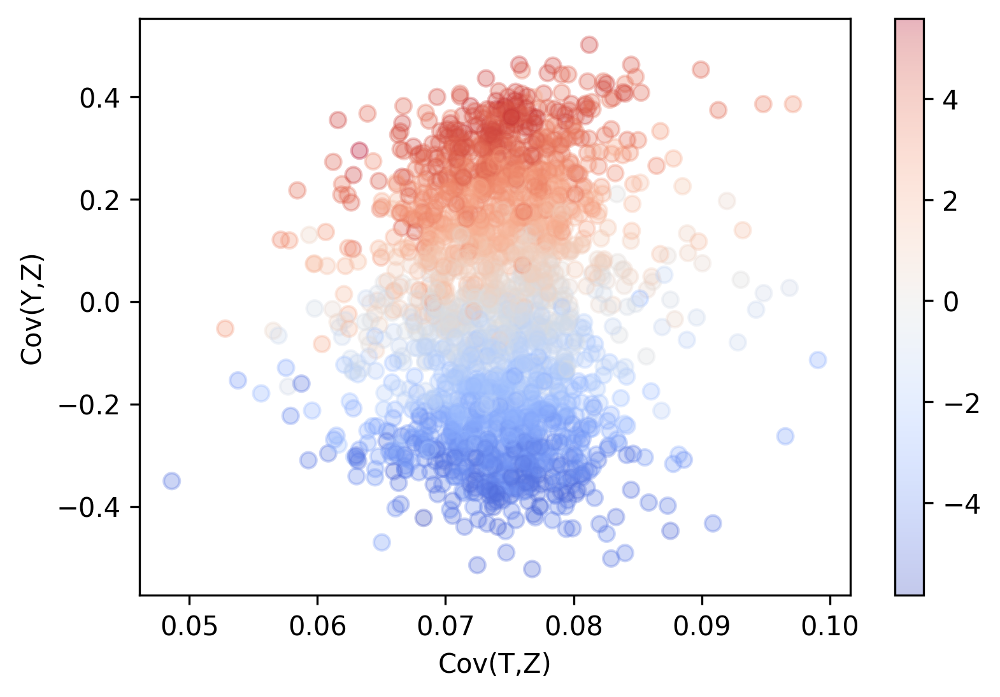

In [208]:
# plot heatmap scatter plot
sc = plt.scatter(x=X_test[:,6], y=X_test[:, 7], c=preds, cmap='coolwarm', alpha=0.3)
plt.colorbar(sc)
plt.ylabel("Cov(Y,Z)")
plt.xlabel("Cov(T,Z)")

Text(0.5, 0, 'Cov(T,Z)')

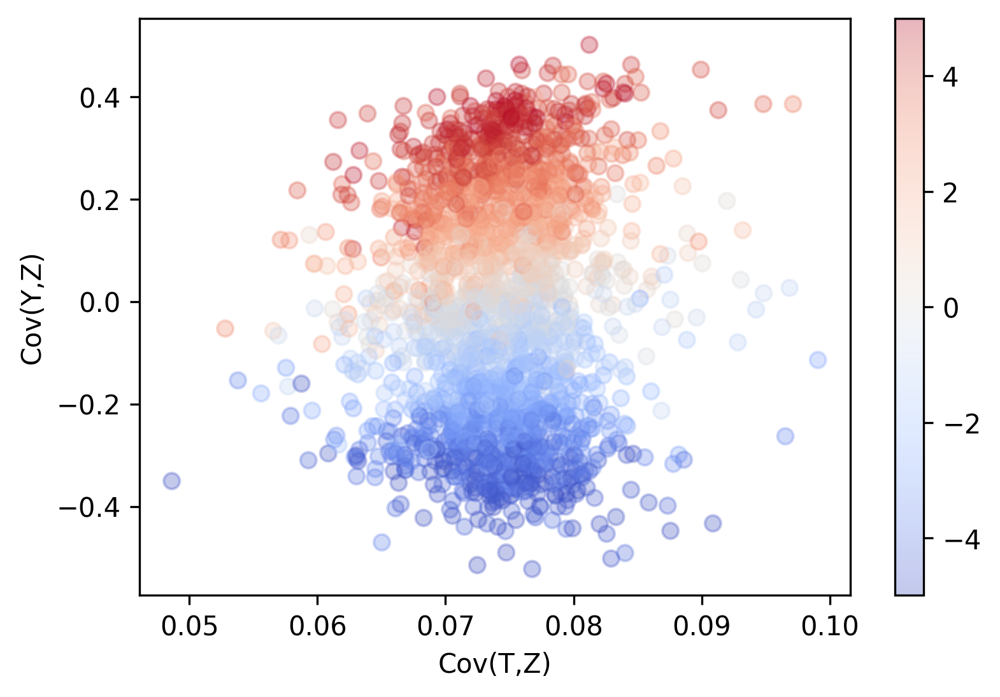

In [209]:
# plot heatmap scatter plot
sc = plt.scatter(x=X_test[:,6], y=X_test[:, 7], c=y_test, cmap='coolwarm', alpha=0.3)
plt.colorbar(sc)
plt.ylabel("Cov(Y,Z)")
plt.xlabel("Cov(T,Z)")

In [210]:
pd.Series(preds).describe()

count    2000.000000
mean       -0.145472
std         2.913174
min        -5.827995
25%        -2.697740
50%        -0.234849
75%         2.404254
max         5.582203
dtype: float64

Text(0.5, 0, 'x')

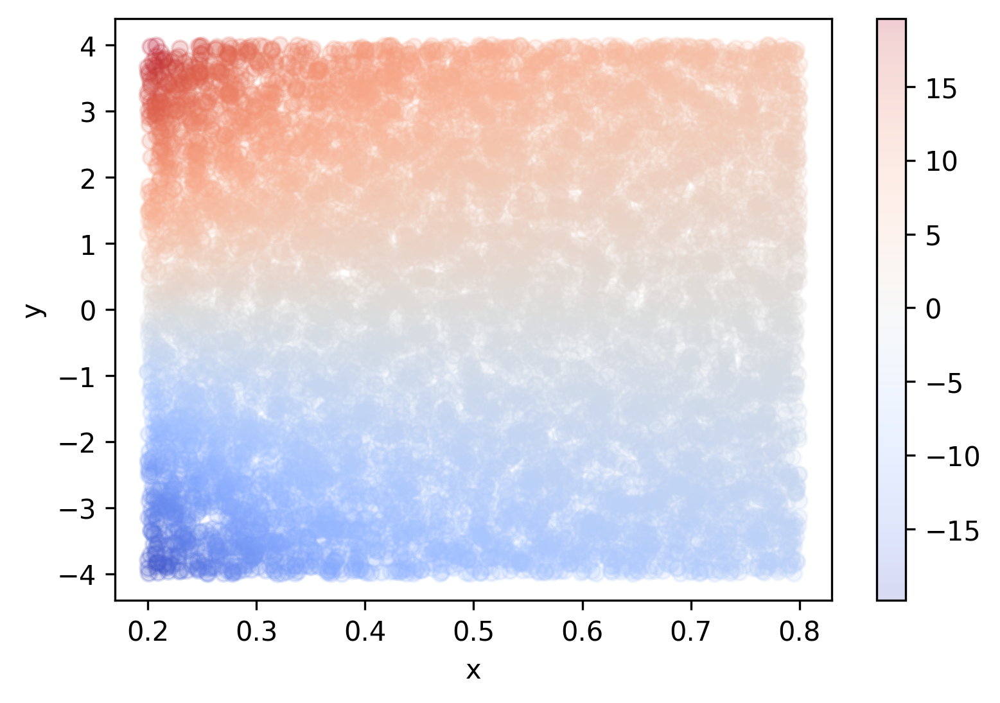

In [211]:
# plot y/x as a heatmap
x = np.random.uniform(0.2, 0.8, size=10000)
y = np.random.uniform(-4, 4, size=10000)
z = y / x

sc = plt.scatter(x=x, y=y, c=z, cmap='coolwarm', alpha=0.2)
plt.colorbar(sc)
plt.ylabel("y")
plt.xlabel("x")

# Flu IV

In [249]:
flu_df = pd.read_stata("../flu_clean.dta")

In [250]:
flu_df.head()

,assign,receive,outcome,age,copd,dm,heartd,white,renal,female,liverd,comp
0,1,1,0,73,0,1,1,1,0,1,0,1.0
1,0,1,0,65,0,1,0,1,0,1,0,0.0
2,0,1,0,77,1,1,1,1,0,1,0,0.0
3,1,1,0,68,0,1,1,1,0,0,0,1.0
4,1,0,1,68,0,1,1,1,0,1,0,0.0


In [251]:
sel_df = flu_df[flu_df['female'] == 1][['assign', 'receive', 'outcome']]

In [252]:
sel_df.head()

,assign,receive,outcome
0,1,1,0
1,0,1,0
2,0,1,0
4,1,0,1
5,1,0,0


In [257]:
flu_feats = generate_iv_features(sel_df, sel_df.shape[0])

In [258]:
flu_feats

array([ 5.26150628e-01,  2.37970711e-01,  7.74058577e-02,  2.49446608e-01,
        1.81435545e-01,  7.14515610e-02,  2.64790499e-02, -7.25813338e-03,
       -6.38234051e-04,  1.91200000e+03])

In [235]:
%%time
meta_cf = RegressionForest(random_state=42, n_estimators=100)
meta_cf.fit(X_train, y_train, )

preds = meta_cf.predict(X_test)

mse(preds, y_test)

CPU times: user 2.83 s, sys: 189 ms, total: 3.02 s
Wall time: 856 ms


0.03653392395756501

In [239]:
%%time

meta_learner = MLPRegressor(hidden_layer_sizes=(128, 128), 
                            activation='relu',
                            random_state=0)

meta_learner.fit(X_train, y_train)

preds = meta_learner.predict(X_test)

mse(preds, y_test)

CPU times: user 7min 26s, sys: 9min 42s, total: 17min 8s
Wall time: 1min 21s


0.048888390106396895

In [259]:
itt(sel_df, treat='assign', outcome='outcome')

-0.029096941529630174

In [260]:
meta_learner.predict(flu_feats.reshape(1, -1))

array([-0.04452508])

In [261]:
meta_cf.predict(flu_feats.reshape(1, -1))

array([[0.12285647]])

In [262]:
meta_cf.predict_interval(flu_feats.reshape(1, -1))

(array([[0.07730732]]), array([[0.16840561]]))

In [263]:
meta_cf.prediction_stderr(flu_feats.reshape(1, -1))

array([[0.02323979]])

In [264]:
lin_reg.predict(flu_feats.reshape(1, -1))

array([0.4435855])

In [265]:
flu_tsls = IV2SLS.from_formula("outcome ~ 1 +  [receive ~ assign]", data=sel_df)
res = flu_tsls.fit()
res

IV-2SLS Estimation Summary                          
==============================================================================
Dep. Variable:                outcome   R-squared:                     -0.1859
Estimator:                    IV-2SLS   Adj. R-squared:                -0.1865
No. Observations:                1912   F-statistic:                    4.6913
Date:                Mon, Sep 26 2022   P-value (F-stat)                0.0303
Time:                        14:54:46   Distribution:                  chi2(1)
Cov. Estimator:                robust                                         
                                                                              
                             Parameter Estimates                              
==============================================================================
            Parameter  Std. Err.     T-stat    P-value    Lower CI    Upper CI
------------------------------------------------------------------------------
Intercept      0.1426     0.0318     4.4853     0.0000      0.0803      0.2050
receive       -0.2741     0.1266    -2.1659     0.0303     -0.5222     -0.0261
==============================================================================

Endogenous: receive
Instruments: assign
Robust Covariance (Heteroskedastic)
Debiased: False
IVResults, id: 0x7f20f1628990

# Try training on LATE data

## Simulation function

In [104]:
# lifted from sim.py in our data-driven exclusion repo, needs to be cleaned up
from scipy.stats import norm
from sklearn.datasets import make_regression

def create_covariates(n_samples, seed=0, **kwargs):
    """
    Generates a covariate matrix of the given number of samples and features.

    Args:
        n_samples (int): number of samples to generate
        seed (int): seed for reproducibility
        **kwargs (dict): other keyword arguments passed to make_regression

    Returns:
        pd.DataFrame
    """
    #print(kwargs)

    X, y = make_regression(n_samples=n_samples, random_state=seed, **kwargs)

    feat_cols = ["feat_" + str(x) for x in range(X.shape[1])]

    df = pd.DataFrame(X, columns=feat_cols)

    # min max scale to [0, 1]
    # change 0 to -1 to scale to [-1, 1]
    rescale_y = 0 + ((y - np.min(y))*(1 - (0)) / (np.max(y) - np.min(y)))

    df['comply_coeff'] = rescale_y

    return df


def generate_IV_comply_indicator(n_samples, tau, seed=0,
                                 prop_nt=0.4, prop_at=0.4, prop_z=0.5,
                                 C_T=0.8, Z_T=0.8,
                                 confound_effect=1,
                                 use_covars=False,
                                 regression_dict={}):
    """
    Generates IV data with perfect compliance indicator X.

    Note from Baocchi et al. 2014 Eq 16 that "instrument strength" is equivalent to proportion of compliers.

    See this for simulating IVs:
        - https://statmodeling.stat.columbia.edu/2019/06/20/how-to-simulate-an-instrumental-variables-problem/

    Args:
        n_samples (int): the number of samples to generate
        tau (float): the treatment effect on compliers to measure
        seed (int): seed for reproducibility
        prop_nt (float): the proportion of never takers
        prop_at (float): the proportion of always takers, note that prop_comply is then 1 - prop_nt - prop_at
        prop_z (float): the proportion of individuals "encouraged" by the instrument
        C_T (float): the covariance between the confounder and treatment; only applies to compliers
        Z_T (float): the covariance between the instrument and treatment
        use_covars (bool): whether or not to generate covariates that determine compliance
        regression_dict (dict): kwargs to pass to sklearn.make_regression, only used when use_covars=True

    Returns:
        feat_df (pd.DataFrame): dataframe containing all columns for IV analysis
    """
    assert (prop_nt + prop_at) < 1, "proportion of compliers needs to be > 0"

    if use_covars:
        feat_df = create_covariates(n_samples=n_samples, seed=seed, **regression_dict)

        loc, scale = norm.fit(feat_df['comply_coeff'])

        def comply_indicator(x):
            if x < norm.ppf(prop_nt, loc=loc, scale=scale):
                return 'nt'
            elif x < norm.ppf(prop_nt + prop_at, loc=loc, scale=scale):
                return 'at'
            else:
                return 'co'
    else:
        np.random.seed(seed)
        feat_df = pd.DataFrame()
        feat_df['comply_coeff'] = np.random.uniform(0, 1, size=n_samples)

        def comply_indicator(x):
            if x < prop_nt:
                return 'nt'
            elif x < prop_nt + prop_at:
                return 'at'
            else:
                return 'co'

    feat_df['comply_status'] = feat_df['comply_coeff'].apply(comply_indicator)
    X = (feat_df['comply_status'] == 'co').astype(int)

    # vars:             Z    T    C
    covar = np.array([[1.0, Z_T, 0.0], # Z
                      [Z_T, 1.0, C_T], # T
                      [0.0, C_T, 1.0]])# C

    covar += np.eye(3,3)

    # vars:  Z  T  C
    means = [0, 0, 0]

    # generate Z, T, Z
    data = np.random.multivariate_normal(mean=means, cov=covar, size=n_samples)

    # generate binary instrument
    Z = (data[:, 0] > norm.ppf(1-prop_z)).astype(int)

    # generate endogenous treatment
    T = (data[:, 1] > 0).astype(int)

    # fill in Z when the sample is a complier, 0 for nt, 1 for at
    T = np.where(feat_df['comply_status'] == 'co', Z, T)
    T = np.where(feat_df['comply_status'] == 'nt', 0, T)
    T = np.where(feat_df['comply_status'] == 'at', 1, T)

    C = data[:, 2]

    # add noncomplier bias, currently symmetric for never-takers and always-takers
    nc_bias_eff = 0.25
    B = np.where(X != 1, nc_bias_eff, 0)

    #Y = (tau + B)*T + C + np.random.normal(0, 1, n_samples)

    # TODO optionally add heteroskedastic noise
    if use_covars:
        Y = (tau + B)*T + (confound_effect*feat_df['comply_coeff']) + np.random.normal(0, 1, n_samples) # + ((1-X) * np.random.normal(0, 1, n_samples))
    else:
        Y = (tau + B)*T + (confound_effect*C) + np.random.normal(0, 1, n_samples) # + ((1-X) * np.random.normal(0, 1, n_samples))

    feat_df['Z'] = Z
    feat_df['X'] = X
    feat_df['T'] = T
    feat_df['C'] = C
    feat_df['Y'] = Y
    feat_df['B'] = B

    return feat_df

## Generate data

In [108]:
n_samples = 10000
#size = 1000

data = np.zeros((n_samples, 10))
taus = np.zeros(n_samples)
confounds = np.zeros(n_samples)
I_T = 0.9 # instrument strength
C_T = 0.9 # confound strength

for i in tqdm(range(n_samples)):
    np.random.seed(i)
    size = int(np.random.uniform(500, 5000))
    treat_effect = np.random.uniform(-5, 5)
    confound_effect = np.random.uniform(1, 5)
    prop_non_comply = np.random.uniform(0, 0.9)
    data_df = generate_IV_comply_indicator(size, 
                                           tau=treat_effect, 
                                           confound_effect=confound_effect, 
                                           Z_T=I_T, 
                                           C_T=C_T, 
                                           prop_nt=prop_non_comply / 2,
                                           prop_at=prop_non_comply / 2,
                                           seed=i)
    data_df = data_df[['Z','T','Y']]
    
    feats = generate_iv_features(data_df, size)
    data[i,:] = feats
    taus[i] = treat_effect
    confounds[i] = confound_effect

  3%|▎         | 341/10000 [00:02<01:18, 122.38it/s]


KeyboardInterrupt: 

In [78]:
X_train = data[test_size:, :]
X_test = data[:test_size, :]

y_train = taus[test_size:]
y_test = taus[:test_size]

meta_cf = RegressionForest(random_state=42)

In [79]:
%%time
meta_cf.fit(X_train, y_train)

RegressionForest(random_state=42)

In [86]:
%%time
meta_learner.fit(X_train, y_train)

CPU times: user 2min 13s, sys: 2min 33s, total: 4min 47s
Wall time: 15.6 s


MLPRegressor(hidden_layer_sizes=(128, 128), random_state=42)

In [80]:
preds = meta_cf.predict(X_test)

mse(preds, y_test)

0.026229581354562617

In [87]:
preds = meta_learner.predict(X_test)

mse(preds, y_test)

0.29843651964092444

In [82]:
flu_feats

array([ 5.14505418e-01,  2.50262146e-01,  8.52848654e-02,  2.49876932e-01,
        1.87696610e-01,  7.80386339e-02,  2.95853570e-02, -3.68507759e-03,
       -2.23649123e-05,  2.86100000e+03])

In [81]:
meta_cf.predict(flu_feats.reshape(1, -1))

array([[-0.03910439]])

In [88]:
meta_learner.predict(flu_feats.reshape(1, -1))

array([-0.47565573])

In [83]:
meta_cf.predict_interval(flu_feats.reshape(1, -1))

(array([[-0.08978961]]), array([[0.01158083]]))

## Notes

- are we measuring the ITT here??? (ITT_y in this case is -0.028)
- need to double check the assumptions being made here...
- also, should re-run with our compliance iv simulation
- it would be cool to show that if we train our metalearner on LATE data, it then produces the LATE estimate

---

# Full simulations: varying IV strength

In [285]:
iv_strs = np.round(np.linspace(0.1, 0.9, 9), 2)
C_T = 0.9 # confound strength
n_samples = 10000 # number of dataset samples to generate
test_samples = 2000
size = 2000 # the size of each dataset

iv_mses = []
reg_mses = []

iv_stderrs = []
iv_preds = []
reg_preds = []
    
for I_T in tqdm(iv_strs):
    lin_reg_taus = np.zeros(test_samples)
    tsls_taus = np.zeros(test_samples)
    tsls_stderrs = np.zeros(test_samples)
    test_taus = np.zeros(test_samples)

    for i in range(test_samples):
        np.random.seed(i)
        
        #linear, simple IV
        treat_effect = np.random.uniform(-5, 5)
        confound_effect = np.random.uniform(1, 5)

        data_df = generate_iv_data(size, treat_effect, confound_effect, I_T, C_T, seed=i+int(I_T*10), binarize=True)
#        size = int(np.random.uniform(500, 5000))
#         treat_effect = np.random.uniform(-5, 5)
#         confound_effect = np.random.uniform(1, 5)
#         prop_non_comply = 1 - I_T #np.random.uniform(0, 0.9)
#         regression_dict = dict(n_informative=1, 
#                                noise=1, 
#                                n_features=1)
#         data_df = generate_IV_comply_indicator(size, 
#                                                tau=treat_effect, 
#                                                confound_effect=confound_effect, 
#                                                Z_T=I_T, 
#                                                C_T=C_T, 
#                                                prop_nt=prop_non_comply / 2,
#                                                prop_at=prop_non_comply / 2,
#                                                seed=i,
#                                                use_covars=True,
#                                                regression_dict=regression_dict)   
#         data_df['treatment'] = data_df['T']
#         data_df['outcome'] = data_df['Y']
#         data_df['instrument'] = data_df['Z']
        
        lin_reg = LinearRegression()

        lin_reg.fit(data_df['treatment'].values.reshape(-1,1), data_df['outcome'])

        tsls = IV2SLS.from_formula('outcome ~ 1 + [treatment ~ instrument]',
                                   data=data_df)    
        iv_res = tsls.fit()
        
        lin_reg_taus[i] = lin_reg.coef_[0]
        tsls_taus[i] = iv_res.params['treatment']
        tsls_stderrs[i] = iv_res.std_errors['treatment']

        test_taus[i] = treat_effect
        
    iv_preds.append(tsls_taus)
    iv_stderrs.append(tsls_stderrs)
    reg_preds.append(lin_reg_taus)
        
    iv_mses.append(mse(tsls_taus, test_taus))
    reg_mses.append(mse(lin_reg_taus, test_taus))

100%|██████████| 9/9 [04:05<00:00, 27.23s/it]


In [288]:
# metalearning

ml_mses = []

ml_preds = []
test_taus = []
test_feats = []
test_stderrs = []

for I_T in tqdm(iv_strs):
    for i in range(n_samples):
        np.random.seed(i)
        
    
        # linear, simple IV
        treat_effect = np.random.uniform(-5, 5)
        confound_effect = np.random.uniform(1, 5)

        data_df = generate_iv_data(size, treat_effect, confound_effect, I_T, C_T, seed=i+int(I_T*10), binarize=True)
        
        
#         size = int(np.random.uniform(500, 5000))
#         treat_effect = np.random.uniform(-5, 5)
#         confound_effect = np.random.uniform(1, 5)
#         prop_non_comply = np.random.uniform(0, 0.9)
#         data_df = generate_IV_comply_indicator(size, 
#                                                tau=treat_effect, 
#                                                confound_effect=confound_effect, 
#                                                Z_T=I_T, 
#                                                C_T=C_T, 
#                                                prop_nt=prop_non_comply / 2,
#                                                prop_at=prop_non_comply / 2,
#                                                seed=i)
#         data_df = data_df[['Z','T','Y']]

        feats = generate_iv_features(data_df, size)
        data[i,:] = feats
        taus[i] = treat_effect
        confounds[i] = confound_effect
        
    X_train = data[test_samples:, :]
    X_test = data[:test_samples, :]

    y_train = taus[test_samples:]
    y_test = taus[:test_samples]
    
#     meta_learner = MLPRegressor(hidden_layer_sizes=(128, 128), 
#                             activation='relu',
#                             random_state=42)
    
    meta_learner = RegressionForest(random_state=42, n_estimators=500)
    
    meta_learner.fit(X_train, y_train)
    
    preds = meta_learner.predict(X_test)
    std_err = meta_learner.prediction_stderr(X_test)
    ml_preds.append(preds)
    test_taus.append(y_test)
    test_feats.append(X_test)
    test_stderrs.append(std_err)
    
    ml_mses.append(mse(preds, y_test))

100%|██████████| 9/9 [03:00<00:00, 20.11s/it]


(4, 3)


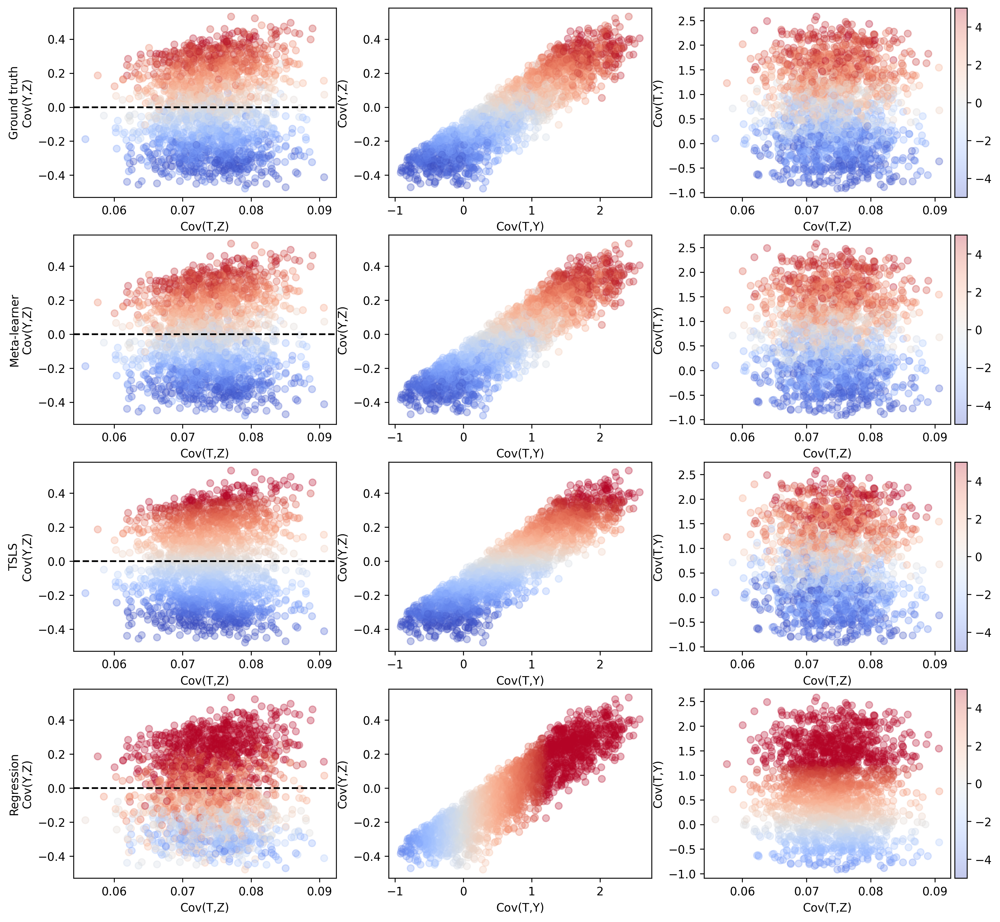

In [290]:
fig, axs = plt.subplots(4, 3, figsize=(14, 14), dpi=300)
fig.patch.set_color("white")
print(axs.shape)

COV_TY = 8
COV_YZ = 7
COV_TZ = 6

idx = -1

X_test = test_feats[idx]

# ground truth
ax1, ax2, ax3 = axs[0]
y = test_taus[idx]
sc = ax1.scatter(x=X_test[:,COV_TZ], y=X_test[:, COV_YZ], c=y, cmap='coolwarm', alpha=0.3, vmin=-5, vmax=5)
ax1.set_xlabel("Cov(T,Z)")
ax1.set_ylabel("Ground truth\nCov(Y,Z)")
sc = ax2.scatter(x=X_test[:,COV_TY], y=X_test[:, COV_YZ], c=y, cmap='coolwarm', alpha=0.3, vmin=-5, vmax=5)
ax2.set_xlabel("Cov(T,Y)")
ax2.set_ylabel("Cov(Y,Z)")
sc = ax3.scatter(x=X_test[:,COV_TZ], y=X_test[:, COV_TY], c=y, cmap='coolwarm', alpha=0.3, vmin=-5, vmax=5)
ax3.set_xlabel("Cov(T,Z)")
ax3.set_ylabel("Cov(T,Y)")
ax1.axhline(y=0, ls='--', color='black')

divider = make_axes_locatable(ax3)
cax = divider.append_axes('right', size='5%', pad=0.05)
fig.colorbar(sc, cax=cax, orientation='vertical')

# ml
ax1, ax2, ax3 = axs[1]
y = ml_preds[idx]
sc = ax1.scatter(x=X_test[:,COV_TZ], y=X_test[:, COV_YZ], c=y, cmap='coolwarm', alpha=0.3, vmin=-5, vmax=5)
ax1.set_xlabel("Cov(T,Z)")
ax1.set_ylabel("Meta-learner\nCov(Y,Z)")
sc = ax2.scatter(x=X_test[:,COV_TY], y=X_test[:, COV_YZ], c=y, cmap='coolwarm', alpha=0.3, vmin=-5, vmax=5)
ax2.set_xlabel("Cov(T,Y)")
ax2.set_ylabel("Cov(Y,Z)")
sc = ax3.scatter(x=X_test[:,COV_TZ], y=X_test[:, COV_TY], c=y, cmap='coolwarm', alpha=0.3, vmin=-5, vmax=5)
ax3.set_xlabel("Cov(T,Z)")
ax3.set_ylabel("Cov(T,Y)")
ax1.axhline(y=0, ls='--', color='black')

divider = make_axes_locatable(ax3)
cax = divider.append_axes('right', size='5%', pad=0.05)
fig.colorbar(sc, cax=cax, orientation='vertical')

# tsls
ax1, ax2, ax3 = axs[2]
y = iv_preds[idx]
sc = ax1.scatter(x=X_test[:,COV_TZ], y=X_test[:, COV_YZ], c=y, cmap='coolwarm', alpha=0.3, vmin=-5, vmax=5)
ax1.set_xlabel("Cov(T,Z)")
ax1.set_ylabel("TSLS\nCov(Y,Z)")
sc = ax2.scatter(x=X_test[:,COV_TY], y=X_test[:, COV_YZ], c=y, cmap='coolwarm', alpha=0.3, vmin=-5, vmax=5)
ax2.set_xlabel("Cov(T,Y)")
ax2.set_ylabel("Cov(Y,Z)")
sc = ax3.scatter(x=X_test[:,COV_TZ], y=X_test[:, COV_TY], c=y, cmap='coolwarm', alpha=0.3, vmin=-5, vmax=5)
ax3.set_xlabel("Cov(T,Z)")
ax3.set_ylabel("Cov(T,Y)")
ax1.axhline(y=0, ls='--', color='black')

divider = make_axes_locatable(ax3)
cax = divider.append_axes('right', size='5%', pad=0.05)
fig.colorbar(sc, cax=cax, orientation='vertical')

# reg
ax1, ax2, ax3 = axs[3]
y = reg_preds[idx]
sc = ax1.scatter(x=X_test[:,COV_TZ], y=X_test[:, COV_YZ], c=y, cmap='coolwarm', alpha=0.3, vmin=-5, vmax=5)
ax1.set_xlabel("Cov(T,Z)")
ax1.set_ylabel("Regression\nCov(Y,Z)")
sc = ax2.scatter(x=X_test[:,COV_TY], y=X_test[:, COV_YZ], c=y, cmap='coolwarm', alpha=0.3, vmin=-5, vmax=5)
ax2.set_xlabel("Cov(T,Y)")
ax2.set_ylabel("Cov(Y,Z)")
sc = ax3.scatter(x=X_test[:,COV_TZ], y=X_test[:, COV_TY], c=y, cmap='coolwarm', alpha=0.3, vmin=-5, vmax=5)
ax3.set_xlabel("Cov(T,Z)")
ax3.set_ylabel("Cov(T,Y)")

ax1.axhline(y=0, ls='--', color='black')
divider = make_axes_locatable(ax3)
cax = divider.append_axes('right', size='5%', pad=0.05)
fig.colorbar(sc, cax=cax, orientation='vertical')




In [291]:
ml_mses

[0.036335722128492474,
 0.03529466935060523,
 0.03476915650254381,
 0.03555017429633855,
 0.03726504927492955,
 0.03729336315312197,
 0.03680847980611585,
 0.03591394843698308,
 0.035525528428862474]

In [292]:
iv_mses

[170591.81011293927,
 64.93870092064486,
 5.787439261934154,
 2.804834795588029,
 1.801384539063525,
 1.2173986106041397,
 0.8423659057061419,
 0.62239078751582,
 0.5111806171503684]

In [293]:
reg_mses

[10.481905899318612,
 10.47520493737237,
 10.486581738592426,
 10.511640749766244,
 10.492644984434353,
 10.480981591067756,
 10.45637576360124,
 10.515674872964173,
 10.50397863869716]

Text(0.5, 1.0, 'MSE for n=2000, confounded treatment, 10k datasets')

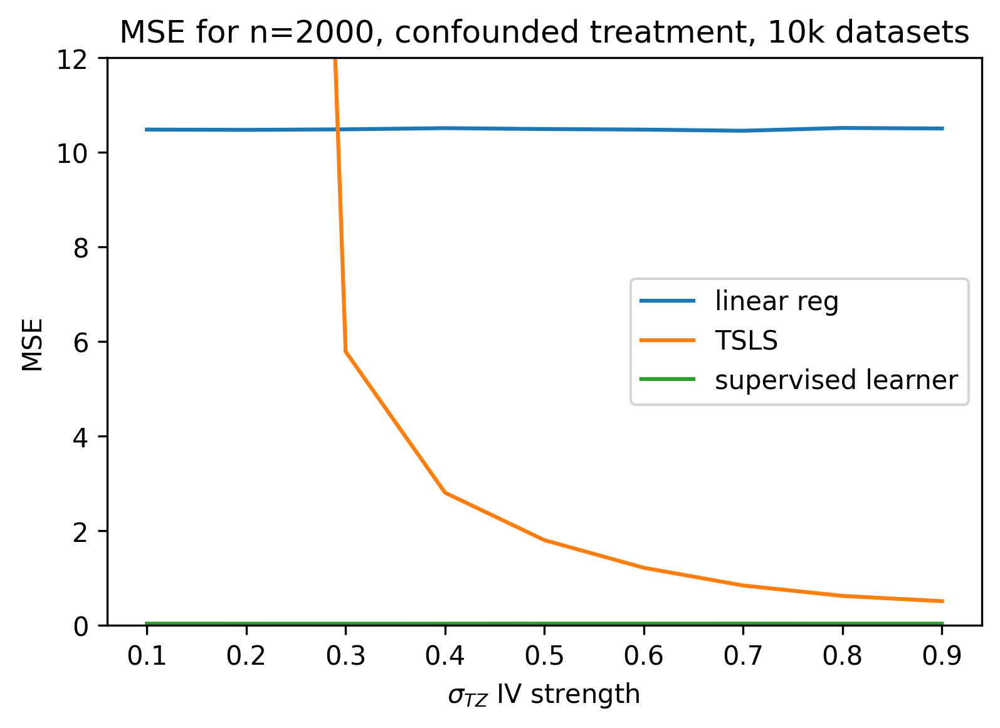

In [295]:
fig, ax = plt.subplots(dpi=300)
fig.patch.set_color("white")

ax.plot(iv_strs, reg_mses, label="linear reg")
ax.plot(iv_strs, iv_mses, label="TSLS")
ax.plot(iv_strs, ml_mses, label="supervised learner")
ax.legend()
ax.set_ylim(0, 12)
ax.set_ylabel("MSE")
ax.set_xlabel("$\sigma_{TZ}$ IV strength ")
ax.set_title("MSE for n=2000, confounded treatment, 10k datasets")

In [298]:
iv_stderrs[0].shape

(2000,)

In [315]:
test_stderrs[0]

array([[0.01721191],
       [0.04890642],
       [0.01456639],
       ...,
       [0.04181524],
       [0.0483738 ],
       [0.0525256 ]])

In [306]:
# examine stderrs
# create dataset, longform
se_df = pd.DataFrame()

for i, iv_str in enumerate(iv_strs):
    
    iv_df = pd.DataFrame()
    iv_df['std_err'] = iv_stderrs[i]
    iv_df['method'] = 'tsls'
    iv_df['iv_str'] = iv_str
    
    ml_df = pd.DataFrame()
    ml_df['std_err'] = test_stderrs[i].squeeze()
    ml_df['method'] = 'ml'
    ml_df['iv_str'] = iv_str
    
    se_df = pd.concat([se_df, iv_df, ml_df], axis=0)
    

(0.0, 5.0)

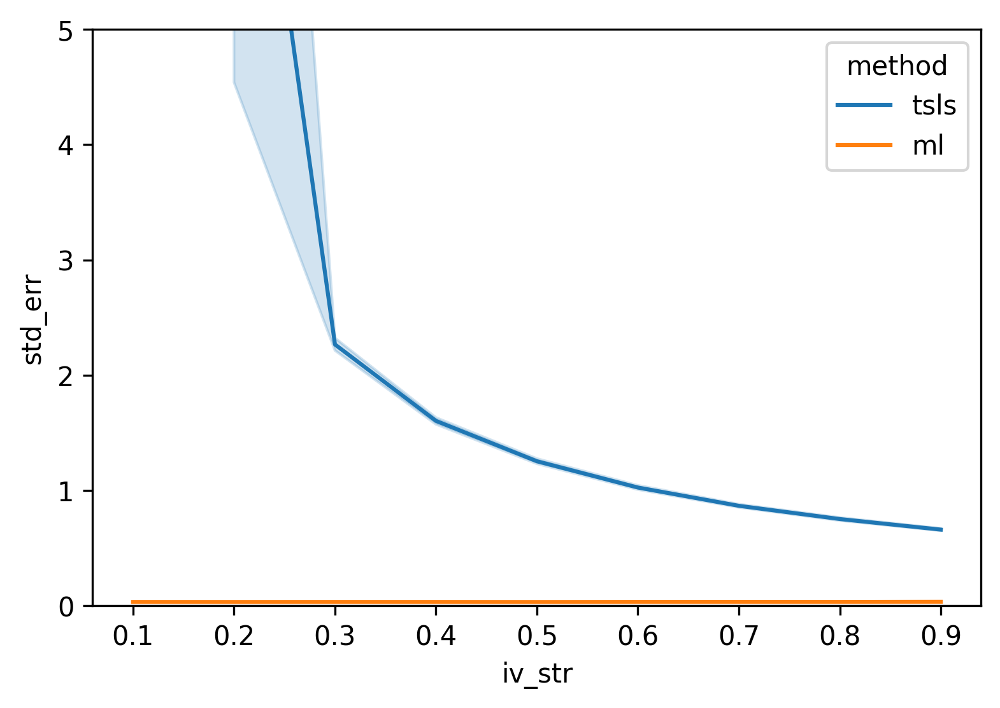

In [318]:
fig, ax = plt.subplots()
sns.lineplot(data=se_df, x='iv_str', y='std_err', hue='method')
ax.set_ylim(0, 5)


Text(0.5, 1.0, 'MSE for n=2000, confounded treatment, 10k datasets')

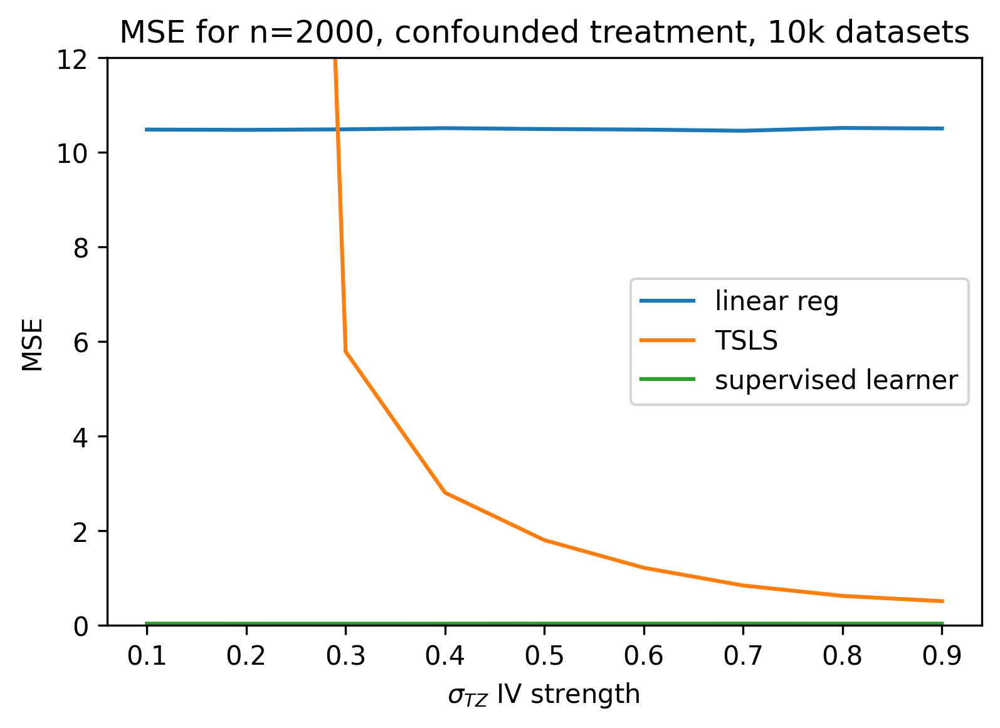

In [295]:
fig, ax = plt.subplots(dpi=300)
fig.patch.set_color("white")

ax.plot(iv_strs, reg_mses, label="linear reg")
ax.plot(iv_strs, iv_mses, label="TSLS")
ax.plot(iv_strs, ml_mses, label="supervised learner")
ax.legend()
ax.set_ylim(0, 12)
ax.set_ylabel("MSE")
ax.set_xlabel("$\sigma_{TZ}$ IV strength ")
ax.set_title("estimator SEs for n=2000, confounded treatment, 10k datasets")

# Supervised Learner simulation: low IV strength

In [381]:
weak_strs = np.linspace(0.0, 0.09, 2) #np.linspace(0.01, 0.1, 10)

In [382]:
# metalearning

weak_ml_mses = []

weak_ml_preds = []
weak_test_taus = []
weak_test_feats = []
weak_test_stderrs = []
size = 2000

for I_T in tqdm(weak_strs):
    print(I_T)
    data = np.zeros((n_samples, 10))
    for i in range(n_samples):
        np.random.seed(i+int(I_T*1000))
        
        # linear, simple IV
        treat_effect = np.random.uniform(-5, 5)
        confound_effect = np.random.uniform(1, 5)

        data_df = generate_iv_data(size, treat_effect, confound_effect, I_T, C_T, seed=i+int(I_T*1000), 
                                   binarize=True, confound_mean=2)
        
#         size = int(np.random.uniform(500, 5000))
#         treat_effect = np.random.uniform(-5, 5)
#         confound_effect = np.random.uniform(1, 5)
#         prop_non_comply = np.random.uniform(0, 0.9)
#         data_df = generate_IV_comply_indicator(size, 
#                                                tau=treat_effect, 
#                                                confound_effect=confound_effect, 
#                                                Z_T=I_T, 
#                                                C_T=C_T, 
#                                                prop_nt=prop_non_comply / 2,
#                                                prop_at=prop_non_comply / 2,
#                                                seed=i)
#         data_df = data_df[['Z','T','Y']]

        feats = generate_iv_features(data_df, size)
        if feats.shape[0] < 10:
            print(feats)
            display(data_df.head())
        data[i,:] = feats
        taus[i] = treat_effect
        confounds[i] = confound_effect
        
    X_train = data[test_samples:, :].copy()
    X_test = data[:test_samples, :].copy()

    y_train = taus[test_samples:].copy()
    y_test = taus[:test_samples].copy()
    
#     meta_learner = MLPRegressor(hidden_layer_sizes=(128, 128), 
#                             activation='relu',
#                             random_state=42)
    
    meta_learner = RegressionForest(random_state=42, n_estimators=500)
    
    meta_learner.fit(X_train, y_train)
    
    preds = meta_learner.predict(X_test)
    std_err = meta_learner.prediction_stderr(X_test)
    weak_ml_preds.append(preds)
    weak_test_taus.append(y_test)
    weak_test_feats.append(X_test)
    weak_test_stderrs.append(std_err)
    
    weak_ml_mses.append(mse(preds, y_test))

  0%|          | 0/2 [00:00<?, ?it/s]

0.0


 50%|█████     | 1/2 [00:34<00:34, 34.60s/it]

0.09


100%|██████████| 2/2 [01:09<00:00, 34.64s/it]


In [383]:
weak_ml_mses

[0.04482432670155589, 0.0449665885148845]

In [371]:
weak_ml_mses

[0.035866677823542276,
 0.03594795316886859,
 0.035819053242433084,
 0.03586954650872762,
 0.03606304429141102,
 0.03624194379288929,
 0.036502610670639306,
 0.03646173182055468,
 0.0364495850468689,
 0.036307795193165]

In [377]:
weak_ml_preds[0]

array([[ 0.43346031],
       [-1.04641523],
       [-0.630806  ],
       ...,
       [ 2.72117048],
       [ 0.53044478],
       [ 2.81082147]])

In [378]:
weak_test_taus[0]

array([ 0.48813504, -0.82977995, -0.64005098, ...,  2.7114815 ,
        0.59445577,  3.24520174])

~~TODO figure out what's going on here...is it a copy issue?~~ -> yes it was, but the results are still largely the same

# Full simulations: varying confounder strength

In [ ]:
# def sim_iv_linreg(iv_strs, n_samples, size, I_T, C_T):
#     """
    
#     n_samples (int): the number of dataset samples to generate
#     size (int): the size of each dataset
#     I_T (float
#     """

In [258]:
confound_strs = np.round(np.linspace(0.1, 0.9, 9), 2)
I_T = 0.5 # instrument strength
n_samples = 10000 # number of dataset samples to generate
test_samples = 2000
size = 1000 # the size of each dataset

iv_mses = []#np.zeros_like(confound_strs)
reg_mses = []#np.zeroes_like(confound_strs)

iv_preds = []
reg_preds = []
    
for C_T in tqdm(confound_strs):
    lin_reg_taus = np.zeros(test_samples)
    tsls_taus = np.zeros(test_samples)
    test_taus = np.zeros(test_samples)

    for i in range(test_samples):
        np.random.seed(i)
        treat_effect = np.random.uniform(-5, 5)
        confound_effect = np.random.uniform(1, 5)

        data_df = generate_iv_data(size, treat_effect, confound_effect, I_T, C_T, seed=i+int(C_T*10))

        lin_reg = LinearRegression()

        lin_reg.fit(data_df['treatment'].values.reshape(-1,1), data_df['outcome'])

        tsls = IV2SLS.from_formula('outcome ~ 1 + [treatment ~ instrument]',
                                   data=data_df)    
        iv_res = tsls.fit()
        
        lin_reg_taus[i] = lin_reg.coef_[0]
        tsls_taus[i] = iv_res.params['treatment']
        test_taus[i] = treat_effect
        
    iv_preds.append(tsls_taus)
    reg_preds.append(lin_reg_taus)
        
    iv_mses.append(mse(tsls_taus, test_taus))
    reg_mses.append(mse(lin_reg_taus, test_taus))

100%|██████████| 9/9 [03:04<00:00, 20.52s/it]


In [266]:
n_samples

10000

In [267]:
# metalearning

ml_mses = []

ml_preds = []
test_taus = []
test_feats = []

for C_T in tqdm(confound_strs):
    for i in range(n_samples):
        np.random.seed(i+int(C_T*10))
        treat_effect = np.random.uniform(-5, 5)
        confound_effect = np.random.uniform(1, 5)

        data_df = generate_iv_data(size, treat_effect, confound_effect, I_T, C_T, seed=i+int(C_T*10))

        feats = generate_iv_features(data_df, size)
        data[i,:] = feats
        taus[i] = treat_effect
        confounds[i] = confound_effect
        
    X_train = data[test_samples:, :]
    X_test = data[:test_samples:, :]

    y_train = taus[test_samples:]
    y_test = taus[:test_samples]
    
    meta_learner = MLPRegressor(hidden_layer_sizes=(128, 128), 
                            activation='relu',
                            random_state=42)
    
    meta_learner.fit(X_train, y_train)
    
    preds = meta_learner.predict(X_test)
    ml_preds.append(preds)
    test_taus.append(y_test)
    test_feats.append(X_test)
    
    ml_mses.append(mse(preds, y_test))

100%|██████████| 9/9 [12:25<00:00, 82.88s/it] 


In [269]:
ml_mses

[0.03103974734088111,
 0.030159544797050103,
 0.031036592396327164,
 0.034595572356987236,
 0.057666933618528586,
 0.08375883748330258,
 0.052217345283188325,
 0.050022132653636,
 0.07988038843251383]

Text(0.5, 1.0, 'MSE for n=1000, confounded treatment, 10k datasets')

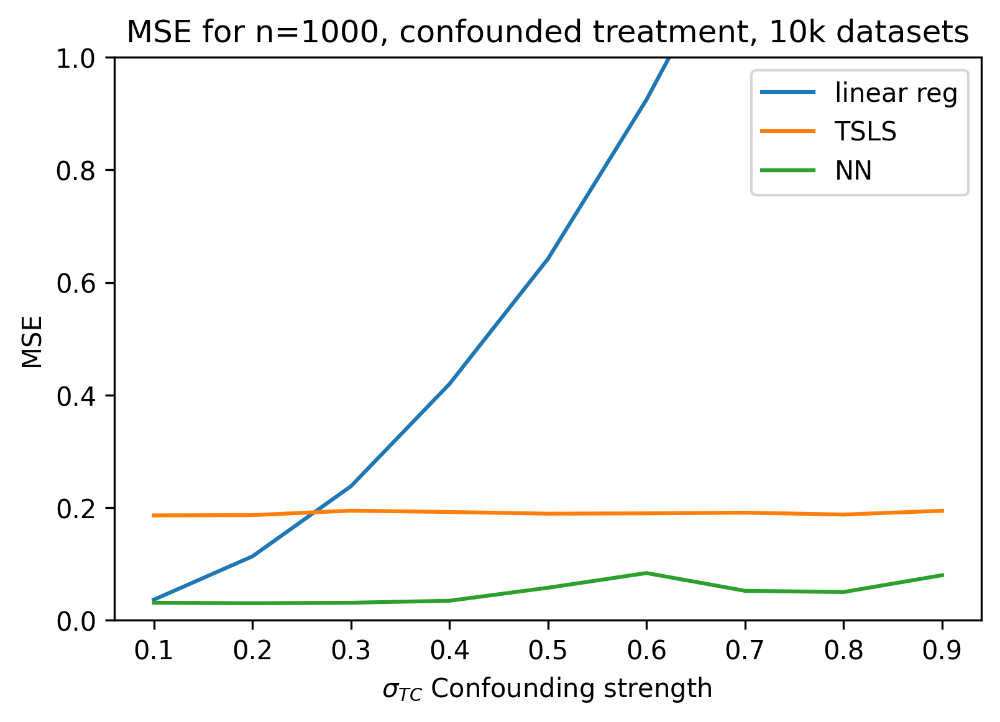

In [270]:
fig, ax = plt.subplots(dpi=300)
fig.patch.set_color("white")

ax.plot(confound_strs, reg_mses, label="linear reg")
ax.plot(confound_strs, iv_mses, label="TSLS")
ax.plot(confound_strs, ml_mses, label="NN")
ax.legend()
ax.set_ylim(0, 1)
ax.set_ylabel("MSE")
ax.set_xlabel("$\sigma_{TC}$ Confounding strength ")
ax.set_title("MSE for n=1000, confounded treatment, 10k datasets")

# TODOs

- ~~can also run OLS, 2SLS on the non-featurized datasets, record their estimated taus, and compute those MSEs~~
- need to re-run experiments with binarized treatment and instruments